In [ ]:
# ── Notebook parameters ─────────────────────────────────────────
# Defaults for interactive use. extract_notebook_figures.py will
# override these via a cell injected right below this one.
#
# Add notebook-level globals here, e.g.:
CKPT_DIR  = "outputs/checkpoints/wandb-xxx"  # Taylor–Green vortex (working)
CKPT_FILE = "step_xxx.pt"




In [2]:
%load_ext autoreload
import torch
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('..')
import os

from notebook_helpers import field_to_img, periodic_gaussian_mixture, visualize_generator_U
os.chdir('..')


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Section 1 — Loading the Checkpoint

After running `reg_cob.py` with a volume-preserving regularizer
(`+euclidean_group=...` or `+vortex_experiment=...`), a checkpoint
folder is created at `outputs/checkpoints/<run_name>/`.
Set `CKPT_DIR` and `CKPT_FILE` below to point to a saved run.

The checkpoint stores only `models['neural_isometry']`;
the dictionary and regularizer are re-instantiated from `config.yaml`
in the same directory.

In [3]:
%autoreload 2
import yaml
from omegaconf import OmegaConf
from hydra.utils import instantiate
from infidictionary.neural_isometries import NeuralIsometry
from infidictionary.dictionaries import InfiDictionary
from infidictionary.regularizers import Regularizer, VolumePreserving

# ── Point to a checkpoint produced by reg_cob.py ─────────────────────────────
# (override CKPT_DIR / CKPT_FILE in the parameters cell at the top)
# ─────────────────────────────────────────────────────────────────────────────

with open(f"{CKPT_DIR}/config.yaml") as f:
    conf = OmegaConf.create(yaml.safe_load(f))

isometry: NeuralIsometry      = instantiate(conf.neural_isometry).to(device)
dictionary: InfiDictionary    = instantiate(conf.initial_dictionary)
regularizer: VolumePreserving = instantiate(conf.regularizer)

ckpt = torch.load(f"{CKPT_DIR}/{CKPT_FILE}", map_location=device, weights_only=False)
isometry.load_state_dict(ckpt["models"]["neural_isometry"])

<All keys matched successfully>

In [4]:
from infidictionary.regularizers import EuclideanGroup, TaylorGreenVortex

model_state_kwargs = dict(conf.get("model_state_kwargs", {"num_steps": 20}))
pushforward_kwargs = dict(conf.get("pushforward_kwargs", {"start_time": 0.0, "end_time": 1.0}))
model_state_kwargs = {'num_steps': 200}
isometry.shuffle_model_state(**model_state_kwargs)
isometry.eval()


def regularizer_summary(reg: VolumePreserving) -> str:
    """One-line description of the volume-preserving map T."""
    if isinstance(reg, EuclideanGroup):
        return (f"mirrors={list(reg.mirrors)}, "
                f"rotation={reg.rotation.tolist()}, "
                f"translation={reg.translation.tolist()}")
    if isinstance(reg, TaylorGreenVortex):
        return (f"Taylor–Green vortex: T={reg.total_time}, k={reg.wavenumber}, "
                f"A={reg.amplitude}, RK4 steps={reg.num_steps}")
    return f"{type(reg).__name__}"


print(f"Loaded     : {CKPT_DIR}/{CKPT_FILE}  (epoch {ckpt['epoch']})")
print(f"Metric     : {ckpt['metric']:.6f}  |  best: {ckpt['best_metric']:.6f}")
print(f"Regularizer: {type(regularizer).__name__}")
print(f"  {regularizer_summary(regularizer)}")
print(f"Isometry tspan steps: {len(isometry.tspan)}")

Loaded     : outputs/checkpoints/wandb-kay59tlz/step_114132.pt  (epoch 114131)
Metric     : 2.251755  |  best: 0.046582
Regularizer: TaylorGreenVortex
  Taylor–Green vortex: T=0.5, k=1, A=1.0, RK4 steps=16
Isometry tspan steps: 200


## Section 2 — Volume-Preserving Regularizer Properties

Every volume-preserving (measure-preserving) map $T$ of the torus $[0,1)^d$ induces an $L^2$ isometry via $f \mapsto f \circ T$.  The `VolumePreserving` family of regularizers enforces that the learned isometry $Q$ satisfies
$$Q\phi_k(x) \approx \phi_k(T(x)) \quad \forall x.$$

Two concrete subclasses are currently available:
- **`EuclideanGroup`** — quarter-turn rotation + translation + axis mirrors of the torus.
- **`TaylorGreenVortex`** — RK4-integrated flow of the divergence-free Taylor–Green velocity field.

`update_coordinates` samples a fresh set of quadrature points and pre-computes their
transformed counterparts $T(x)$, which are stored in `regularizer._transformed_coords`.

### Scatter of Particles Under the Transformation

We call `update_coordinates` to sample quadrature points $\{x_i\}$ on $[0,1]^2$ and compute $\{T(x_i)\}$.

For $T^*$ to be an $L^2$ isometry, $T$ must be **measure-preserving** on the torus $[0,1)^2$, i.e. $|\det J_T| = 1$ everywhere.  This holds for `EuclideanGroup` (each piece — rotation, translation, mirror — has unit Jacobian) and for `TaylorGreenVortex` (the Taylor–Green velocity field is divergence-free, so its flow is a symplectomorphism of the torus).

The two panels below show $x_i$ (left) and $T(x_i)$ (right).  **Match particles by their number** — the same index appears in both panels with the same colour.  A **diamond** $\diamond$ means the particle crossed a torus boundary before wrapping back into $[0,1)^2$; a **circle** $\circ$ means it stayed inside.


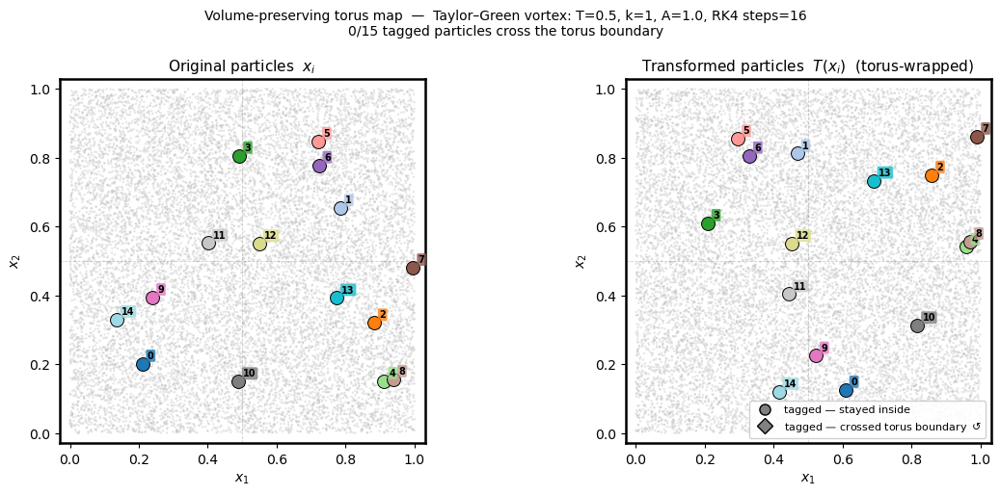

In [5]:
%autoreload 2
import matplotlib.lines as mlines

# ── Background: RANDOM cloud (not stratified) ────────────────────────────────
# A stratified grid + irrational rotation creates rotated parallelogram cells
# that don't tile the torus periodically for finite N.  The resulting scatter
# of T(x_i) shows systematic voids even though |det J_T| = 1 (T IS volume-
# preserving).  This does NOT affect training: the energy integral is over x,
# not over T(x), so uniform coverage of x is what matters.
# We use a pure-random cloud here purely to make the uniform density visible.
N_VIS    = 15000
N_TAGGED = 15
SEED     = 42

rng_np = np.random.default_rng(SEED)
vis_coords = torch.as_tensor(rng_np.random((N_VIS, 2)), dtype=torch.float32)
vis_wrapped = regularizer.transform(vis_coords).numpy()
vis_coords_np = vis_coords.numpy()

# ── Tagged particles: identify wrapping ──────────────────────────────────────
tag_idx = rng_np.choice(N_VIS, size=N_TAGGED, replace=False)
wrapped = ((vis_wrapped[tag_idx] < 0) | (vis_wrapped[tag_idx] >= 1)).any(axis=1)
palette = plt.cm.tab20(np.linspace(0, 1, N_TAGGED))

# ── Plot ─────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 5.2))

for ax, pts, title in zip(
    axes,
    [vis_coords_np, vis_wrapped],
    ['Original particles  $x_i$',
     'Transformed particles  $T(x_i)$  (torus-wrapped)'],
):
    ax.scatter(pts[:, 0], pts[:, 1], s=3, color='#c0c0c0', alpha=0.4,
               edgecolors='none', zorder=1)

    for j, idx in enumerate(tag_idx):
        x, y   = pts[idx]
        marker = 'D' if wrapped[j] else 'o'
        ax.scatter(x, y, s=100, color=palette[j], marker=marker,
                   edgecolors='k', linewidths=0.7, zorder=4)
        ax.text(x + 0.015, y + 0.015, str(j), fontsize=7, fontweight='bold',
                color='k', zorder=5,
                bbox=dict(facecolor=palette[j], edgecolor='none',
                          alpha=0.80, pad=1.5, boxstyle='round,pad=0.15'))

    ax.set_title(title, fontsize=11)
    ax.set_xlabel('$x_1$'); ax.set_ylabel('$x_2$')
    ax.set_aspect('equal')
    ax.set_xlim(-0.03, 1.03); ax.set_ylim(-0.03, 1.03)
    ax.axhline(0.5, color='grey', lw=0.6, ls='--', alpha=0.4)
    ax.axvline(0.5, color='grey', lw=0.6, ls='--', alpha=0.4)
    for spine in ax.spines.values():
        spine.set_linewidth(1.8)

h_ok   = mlines.Line2D([], [], color='grey', marker='o', ls='none',
                        markersize=8, markeredgecolor='k', label='tagged — stayed inside')
h_wrap = mlines.Line2D([], [], color='grey', marker='D', ls='none',
                        markersize=8, markeredgecolor='k',
                        label=r'tagged — crossed torus boundary $\circlearrowleft$')
axes[1].legend(handles=[h_ok, h_wrap], loc='lower right', fontsize=8, framealpha=0.9)

n_wrap = int(wrapped.sum())
fig.suptitle(
    f'Volume-preserving torus map  —  {regularizer_summary(regularizer)}\n'
    f'{n_wrap}/{N_TAGGED} tagged particles cross the torus boundary',
    fontsize=10,
)
plt.tight_layout()
plt.show()


### Fourier Atom Before and After Domain Transformation

We evaluate a Fourier atom $\phi_k$ at
1. the **original** grid coordinates $x$,
2. the **transformed** grid coordinates $T(x)$ (what the regularizer targets), and
3. the **learned pushforward** $Q\phi_k(x)$ (what the isometry actually produces).

If training succeeded, panels 2 and 3 should look identical.

/tmp/ipykernel_1259703/1243913966.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


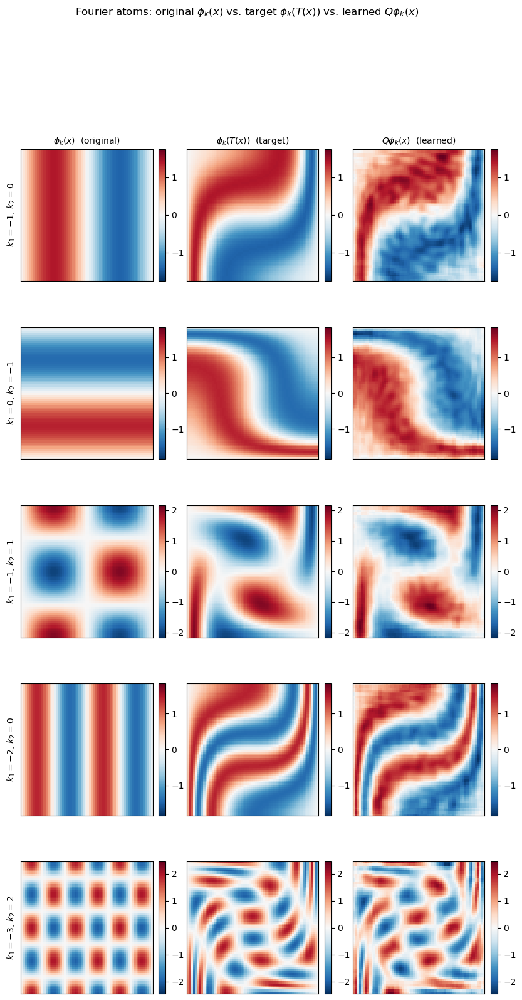

In [6]:
%autoreload 2
from infidictionary.domain_samplers import SquareSampler

N_VIS_COORD = 64  # N_VIS_COORD² quadrature points

coords_viz = SquareSampler(stratified=True, add_noise=False).sample(N_VIS_COORD).to(device)
trans_viz  = regularizer.transform(coords_viz.cpu()).to(device)
lad_viz    = torch.zeros(coords_viz.shape[0], device=device)

SHOW_INDICES = torch.tensor([
    [-1,  0, 0],
    [0,  -1, 0],
    [-1,  1, 0],
    [-2,  0, 0],
    [-3,  2, 0],
], device=device)

with torch.no_grad():
    phi_orig  = dictionary.get_atoms(coords_viz, SHOW_INDICES)   # (A, N, 1) at x
    phi_trans = dictionary.get_atoms(trans_viz,  SHOW_INDICES)   # (A, N, 1) at T(x)
    isometry.shuffle_model_state(**model_state_kwargs)
    _, _, phi_pushed = isometry.pushforward(
        src_coords=coords_viz, src_logabsdet=lad_viz,
        src_field=phi_orig, **pushforward_kwargs,
    )  # (A, N, 1) — Qφ_k(x)

A = len(SHOW_INDICES)

col_titles = [
    r'$\phi_k(x)$  (original)',
    r'$\phi_k(T(x))$  (target)',
    r'$Q\phi_k(x)$  (learned)',
]

fig, axes = plt.subplots(A, 3, figsize=(10, 3.5 * A),
                          gridspec_kw={"wspace": 0.08, "hspace": 0.35})

for i in range(A):
    k1, k2, _ = SHOW_INDICES[i].tolist()
    fields = [phi_orig[i], phi_trans[i], phi_pushed[i]]
    vmax = max(f.abs().max().item() for f in fields) + 1e-8

    for j, (field, col_title) in enumerate(zip(fields, col_titles)):
        ax = axes[i, j]
        img = field_to_img(field, N_VIS_COORD)
        im = ax.imshow(img, origin='lower', cmap='RdBu_r',
                       vmin=-vmax, vmax=vmax, extent=[0, 1, 0, 1])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        ax.set_title(col_title if i == 0 else '', fontsize=10)
        if j == 0:
            ax.set_ylabel(f'$k_1={k1},\\, k_2={k2}$', fontsize=10)
        ax.set_aspect('equal')
        ax.set_xticks([]); ax.set_yticks([])

fig.suptitle(
    r'Fourier atoms: original $\phi_k(x)$ vs. target $\phi_k(T(x))$ vs. learned $Q\phi_k(x)$',
    fontsize=12, y=1.01,
)
plt.tight_layout()
plt.show()

## Section 3 — Initial Basis vs. Learned Basis and Generator Fields

### Fourier Atoms vs. Learned Atoms

Each tile shows one atom $\phi_{k_1,k_2}$ evaluated on a regular grid.

- **Left grid** — original Fourier atoms $\phi_{k_1,k_2}(x)$
- **Right grid** — learned atoms (pushforward) $Q\phi_{k_1,k_2}(x)$

Rows index $k_1$ (vertical frequency), columns $k_2$ (horizontal frequency).
Diverging colourmap centred at zero: blue = negative, red = positive.

`NUM_TRUNCATED` controls the spatial half-bandwidth: $(2 \cdot \text{NUM\_TRUNCATED} - 1)^2$ atoms total.

In [7]:
%autoreload 2
from infidictionary.domain_samplers import SquareSampler

N_VIZ        = 64    # N_VIZ² must be divisible by sub_size=32
NUM_TRUNCATED = 6    # half-bandwidth: (2·NUM_TRUNCATED-1)² atoms
HEXGRIDSIZE  = 45
TILE_SIZE    = 2.0

grid_coords    = SquareSampler(stratified=True, add_noise=False).sample(N_VIZ).to(device)
grid_logabsdet = torch.zeros(grid_coords.shape[0], device=device)

indices = dictionary.get_truncated_indices(num_truncated=NUM_TRUNCATED)
idx_np  = indices.cpu().numpy()  # (A, 3): k1, k2, channel
print(f"Indices: {indices.shape}  "
      f"(k range {idx_np[:, :-1].min()} to {idx_np[:, :-1].max()}, "
      f"channels {sorted(set(idx_np[:, -1].tolist()))})")

k1_vals = sorted(set(int(v) for v in idx_np[:, 0]))
k2_vals = sorted(set(int(v) for v in idx_np[:, 1]))

spatial_lookup = {
    (int(idx_np[i, 0]), int(idx_np[i, 1])): i
    for i in range(len(idx_np))
    if int(idx_np[i, -1]) == 0
}

with torch.no_grad():
    atoms = dictionary.get_atoms(grid_coords, indices.to(device))  # (A, N, C)
    isometry.shuffle_model_state(**model_state_kwargs)
    _, _, deformed = isometry.pushforward(
        src_coords=grid_coords,
        src_logabsdet=grid_logabsdet,
        src_field=atoms,
        **pushforward_kwargs,
    )  # (A, N, C)

atoms_np    = atoms.cpu().numpy()
deformed_np = deformed.cpu().numpy()
print(f"atoms:    {atoms_np.shape}")
print(f"deformed: {deformed_np.shape}")

Indices: torch.Size([121, 3])  (k range -5 to 5, channels [0])
atoms:    (121, 4096, 1)
deformed: (121, 4096, 1)


/tmp/ipykernel_1259703/430860728.py:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


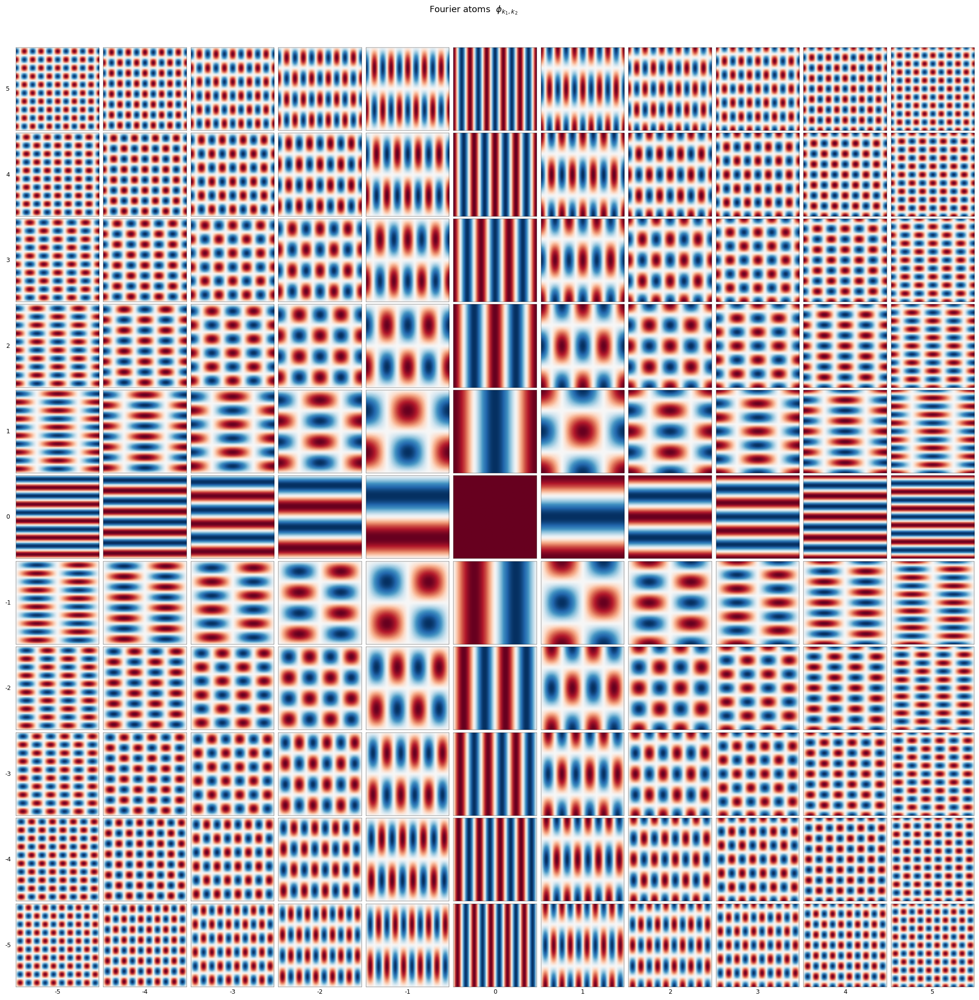

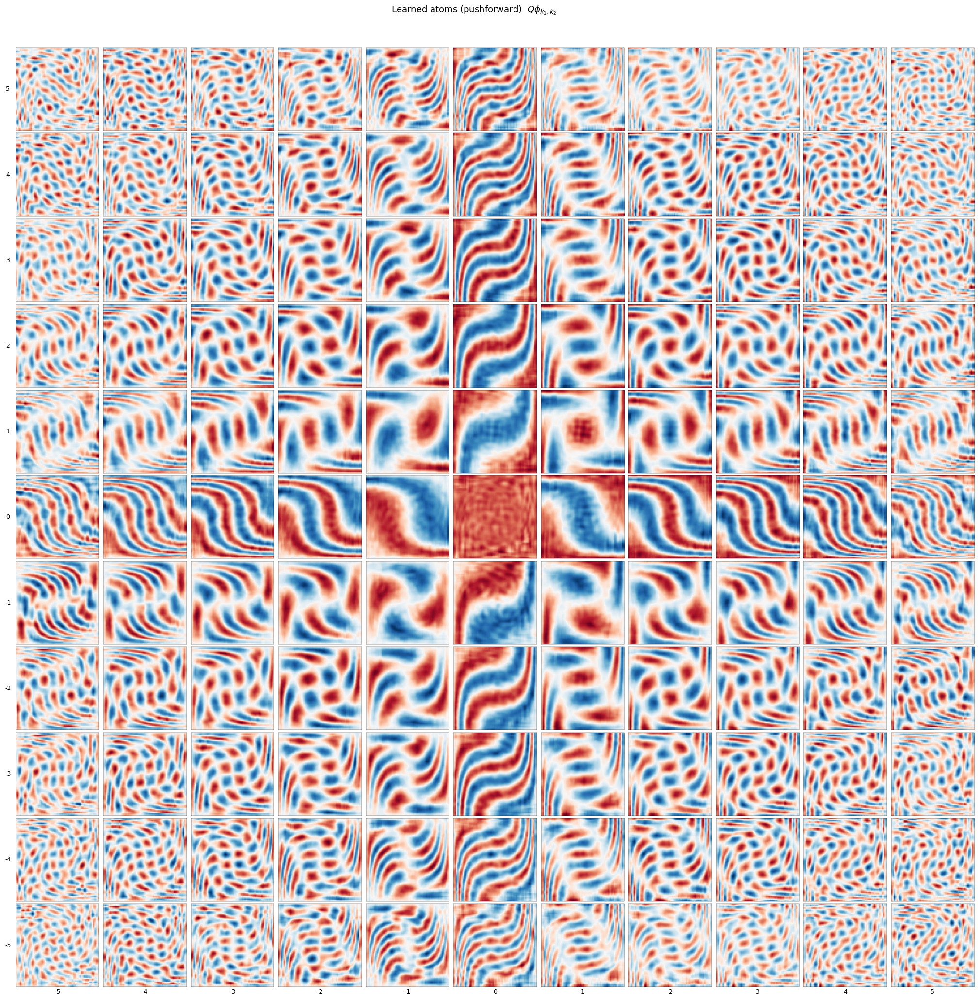

In [8]:
nk1    = len(k1_vals)
nk2    = len(k2_vals)
k1_rev = list(reversed(k1_vals))


def plot_atom_grid(atoms_arr: np.ndarray, title: str) -> None:
    """atoms_arr: (A, N, C) — channel 0 only."""
    fig, axes = plt.subplots(
        nk1, nk2,
        figsize=(nk2 * TILE_SIZE, nk1 * TILE_SIZE),
        gridspec_kw={"wspace": 0.03, "hspace": 0.03},
    )
    fig.subplots_adjust(left=0.07, right=0.97, bottom=0.06, top=0.94)

    for ri, k1 in enumerate(k1_rev):
        for ci, k2 in enumerate(k2_vals):
            ax = axes[ri, ci]
            ax.set_xticks([]); ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_linewidth(0.3)

            key = (int(k1), int(k2))
            if key not in spatial_lookup:
                ax.set_facecolor('#ddd')
                continue

            vals = atoms_arr[spatial_lookup[key], :, 0]  # (N,)
            vmax = np.abs(vals).max() + 1e-8
            img  = field_to_img(torch.tensor(vals), N_VIZ)
            ax.imshow(img, origin='lower', cmap='RdBu_r',
                      vmin=-vmax, vmax=vmax)
            ax.set_aspect('equal')

            if ri == nk1 - 1:
                ax.set_xlabel(str(k2), fontsize=9, labelpad=3)
            if ci == 0:
                ax.set_ylabel(str(k1), fontsize=9, rotation=0,
                              labelpad=12, va='center')

    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.show()


plot_atom_grid(atoms_np,    r'Fourier atoms  $\phi_{k_1,k_2}$')
plot_atom_grid(deformed_np, r'Learned atoms (pushforward)  $Q\phi_{k_1,k_2}$')

### Generator Field $U$ and Rotation $K_R$

The skew-adjoint generator $\mathcal{K}_\theta(t) = U_\theta(t)\,A_\theta(t)\,U_\theta(t)^\ast$ is defined by $R$ spatial functions (the columns of $U$) and a time-dependent skew matrix $A = K_R - K_R^\top$.  Below we evaluate and plot both components on a regular grid at several timesteps.

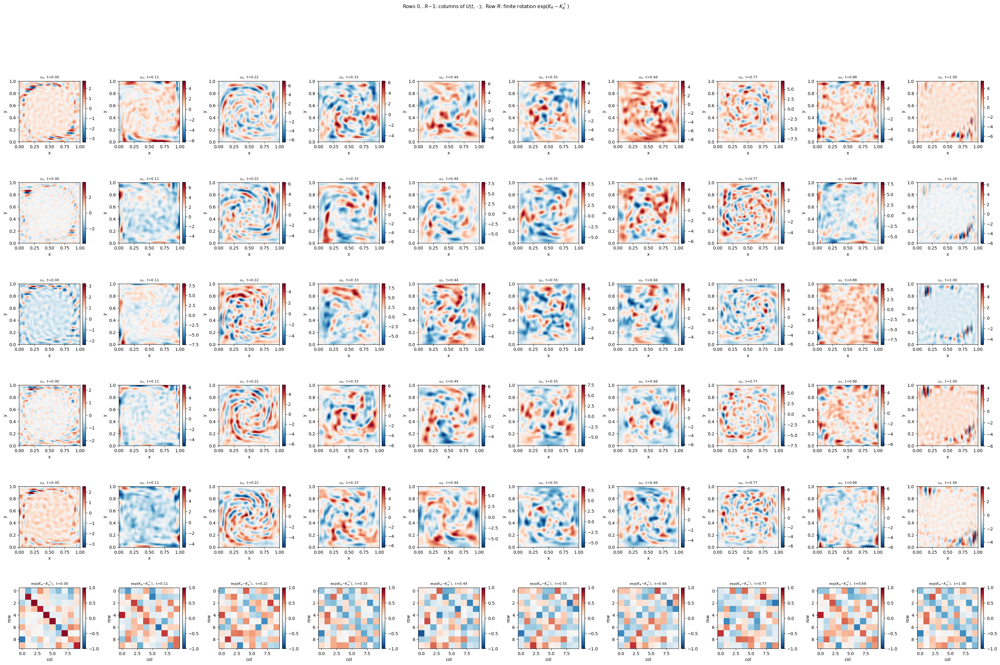

In [19]:
%autoreload 2
from infidictionary.domain_samplers import SquareSampler

timesteps = isometry.tspan.clone()
# pick a subsequence of 10 timesteps uniformly spaced
n_show_t  = min(10, len(timesteps))
pick      = torch.linspace(0, len(timesteps) - 1, n_show_t).long()
timesteps = timesteps[pick]

N_vis = 64
coords_vis = SquareSampler(stratified=True, add_noise=False).sample(N_vis).to(device)

visualize_generator_U(isometry, coords_vis, N_vis, timesteps, device)


## Section 4 — Applying the Isometry to Joseph Fourier's Portrait

We load Joseph Fourier's portrait (`assets/Joseph_Fourier.jpg`), treat it
as an $L^2$ function on $[0,1]^2$, and apply the learned isometry $Q$.

The **pushforward** $Qf$ shows what the isometry does to a natural image
that is *not* a Fourier atom — if $Q$ has learned the volume-preserving
transformation $T$, the transformed image should resemble $f \circ T$.

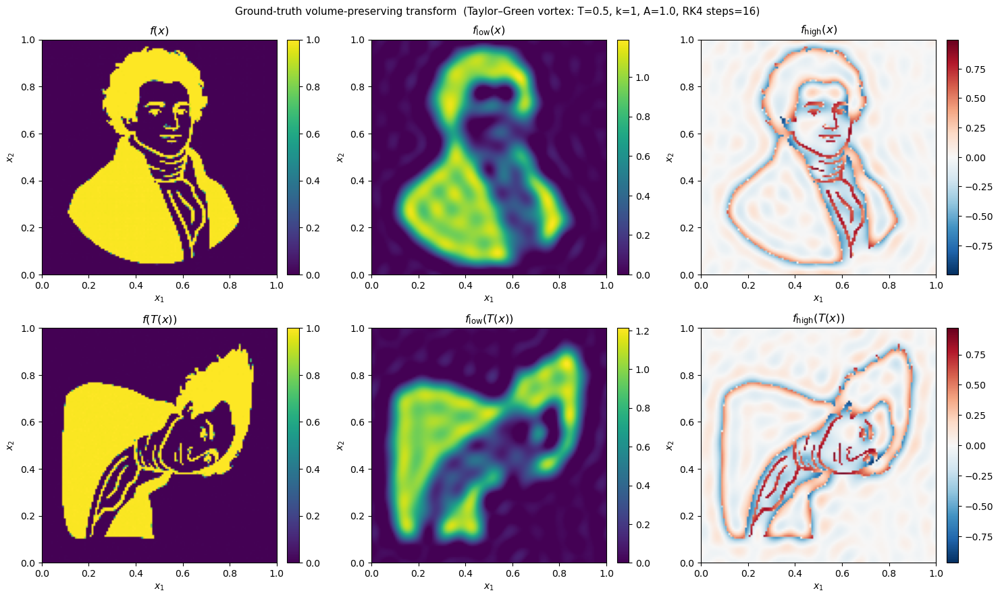

/tmp/ipykernel_1259703/383577397.py:130: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(); plt.show()


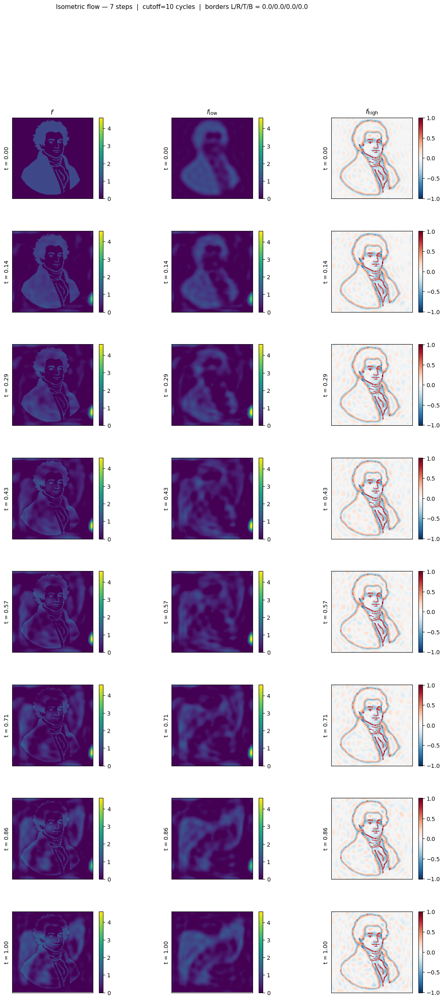

In [10]:
%autoreload 2
from PIL import Image
import torch.nn.functional as F
from infidictionary.domain_samplers import SquareSampler

K_STEPS            = 7      # steps to chain; evolution figure has K_STEPS+1 rows
LOWPASS_FREQ       = 10 # should be 20
BORDER_LEFT        = 0.0 # 1
BORDER_RIGHT       = 0.0 # 4
BORDER_TOP         = 0.0 # 1
BORDER_BOTTOM      = 0.0 # 4
grid_size_portrait = 128
BORDERS            = (BORDER_LEFT, BORDER_RIGHT, BORDER_TOP, BORDER_BOTTOM)

# ── Load portrait ─────────────────────────────────────────────────────────────
img_path = "assets/fourier_cartoon.png"
pil_img  = Image.open(img_path).convert("L")
img_arr  = np.array(pil_img).astype(np.float32) / 255.0
img_t    = 1 - torch.tensor(img_arr, device=device).unsqueeze(0).unsqueeze(0)

def sample_image_at_coords(img_tensor, coords, borders=(0., 0., 0., 0.)):
    left, right, top, bottom = borders
    coords  = coords.to(img_tensor.device)
    inner_x = (coords[:, 0] - left)   / (1. - left - right)
    inner_y = (coords[:, 1] - bottom) / (1. - bottom - top)
    grid = torch.stack([inner_x * 2 - 1, (1 - inner_y) * 2 - 1], dim=-1).view(1, 1, -1, 2)
    return F.grid_sample(img_tensor, grid, mode="bilinear",
                         align_corners=True, padding_mode="zeros").reshape(-1, 1)

def grid_filter(f, N_sq, cutoff, highpass=False):
    f_np   = f[:, 0].detach().cpu().numpy().reshape(N_sq, N_sq)
    F_grid = np.fft.fftshift(np.fft.fft2(f_np))
    cy, cx = N_sq // 2, N_sq // 2
    Y, X   = np.ogrid[:N_sq, :N_sq]
    mask   = np.sqrt((X - cx)**2 + (Y - cy)**2) <= cutoff
    filt   = np.fft.ifft2(np.fft.ifftshift(F_grid * (~mask if highpass else mask))).real
    return torch.tensor(filt.reshape(-1, 1), dtype=torch.float32, device=f.device)

# ── Sampling grid ─────────────────────────────────────────────────────────────
portrait_coords = SquareSampler(stratified=True, add_noise=False).sample(grid_size_portrait).to(device)
portrait_lad    = torch.zeros(portrait_coords.shape[0], device=device)
portrait_trans  = regularizer.transform(portrait_coords.cpu()).to(device)

# ── Input signals at x; ground-truth signals at T(x) ─────────────────────────
f      = sample_image_at_coords(img_t, portrait_coords, BORDERS)
f_low  = grid_filter(f, grid_size_portrait, LOWPASS_FREQ)
f_high = grid_filter(f, grid_size_portrait, LOWPASS_FREQ, highpass=True)

f_gt      = sample_image_at_coords(img_t, portrait_trans, BORDERS)
f_low_gt  = grid_filter(f_gt, grid_size_portrait, LOWPASS_FREQ)
f_high_gt = grid_filter(f_gt, grid_size_portrait, LOWPASS_FREQ, highpass=True)

# ── Figure 1: ground-truth comparison (2 × 3) ────────────────────────────────
col_specs = [
    (r"$f(x)$",              r"$f(T(x))$",              "viridis",  False),
    (r"$f_{\rm low}(x)$",   r"$f_{\rm low}(T(x))$",   "viridis",  False),
    (r"$f_{\rm high}(x)$",  r"$f_{\rm high}(T(x))$",  "RdBu_r", True),
]
row_sigs   = [(f, f_low, f_high), (f_gt, f_low_gt, f_high_gt)]
row_labels = [r"Input  $f(x)$", r"Ground-truth  $f(T(x))$"]

fig1, axes1 = plt.subplots(2, 3, figsize=(15, 9))
for row_i, (sigs, row_label) in enumerate(zip(row_sigs, row_labels)):
    for col_i, ((title_top, title_bot, cmap, sym), sig) in enumerate(zip(col_specs, sigs)):
        ax   = axes1[row_i, col_i]
        img  = field_to_img(sig, grid_size_portrait)
        vmax = float(np.abs(img).max()) + 1e-8
        vmin = -vmax if sym else 0.0
        im = ax.imshow(img, origin='lower', cmap=cmap,
                       vmin=vmin, vmax=vmax, extent=[0, 1, 0, 1])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        ax.set_title(title_top if row_i == 0 else title_bot, fontsize=12)
        ax.set_xlabel("$x_1$"); ax.set_ylabel("$x_2$")
        ax.set_aspect("equal")

fig1.suptitle(f"Ground-truth volume-preserving transform  ({regularizer_summary(regularizer)})", fontsize=11)
plt.tight_layout(); plt.show()

# ── Chained pushforward (batch all three signals together) ────────────────────
src_batch = torch.stack([f, f_low, f_high], dim=0)   # (3, N, 1)
frames    = [src_batch]

isometry.shuffle_model_state(num_steps=400)
with torch.no_grad():
    for k in range(K_STEPS):
        _, _, out = isometry.pushforward(
            src_coords=portrait_coords,
            src_logabsdet=portrait_lad,
            src_field=frames[-1],
            start_time=k / K_STEPS,
            end_time=(k + 1) / K_STEPS,
        )
        frames.append(out)   # (3, N, 1)

# Per-column colour scale consistent across all rows
def _col_vmax(col_i):
    return max(frames[t][col_i, :, 0].abs().max().item() for t in range(len(frames))) + 1e-8

vmax_f, vmax_fl, vmax_fh = _col_vmax(0), _col_vmax(1), _col_vmax(2)
ev_col_specs = [
    (r"$f$",             "viridis",  0.0,       vmax_f ),
    (r"$f_{\rm low}$",  "viridis",  0.0,       vmax_fl),
    (r"$f_{\rm high}$", "RdBu_r", -vmax_fh,  vmax_fh),
]
t_labels = [f"t = {k / K_STEPS:.2f}" for k in range(K_STEPS + 1)]

# ── Figure 2: (K_STEPS+1) × 3 evolution ──────────────────────────────────────
fig2, axes2 = plt.subplots(K_STEPS + 1, 3,
                            figsize=(15, 3.5 * (K_STEPS + 1)),
                            gridspec_kw={"hspace": 0.4, "wspace": 0.05})

for row_i, (t_label, frame) in enumerate(zip(t_labels, frames)):
    for col_i, (col_title, cmap, vmin, vmax) in enumerate(ev_col_specs):
        ax  = axes2[row_i, col_i]
        img = field_to_img(frame[col_i], grid_size_portrait)
        im  = ax.imshow(img, origin='lower', cmap=cmap,
                        vmin=vmin, vmax=vmax, extent=[0, 1, 0, 1])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        if row_i == 0:
            ax.set_title(col_title, fontsize=12)
        ax.set_ylabel(t_label, fontsize=10)
        ax.set_aspect("equal"); ax.set_xlim(0, 1); ax.set_ylim(0, 1)
        ax.set_xticks([]); ax.set_yticks([])

fig2.suptitle(
    f"Isometric flow — {K_STEPS} steps  |  cutoff={LOWPASS_FREQ} cycles  |  "
    f"borders L/R/T/B = {BORDER_LEFT}/{BORDER_RIGHT}/{BORDER_TOP}/{BORDER_BOTTOM}",
    fontsize=11,
)
plt.tight_layout(); plt.show()


### Volume-Preserving Sanity Check — Gaussian Mixture

A clean sanity check: the signal $f$ is a mixture of periodic anisotropic Gaussians.
Under the volume-preserving transformation $T$, the isometry should satisfy
$Qf(x) \approx f(T(x))$ for any signal $f$, not just Fourier atoms.

We compare the **learned** $Qf$ against the **analytical** target $f \circ T$,
tracking the flow at intermediate timesteps $t \in \{0, 1/K, \ldots, 1\}$.

/tmp/ipykernel_1259703/460791838.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


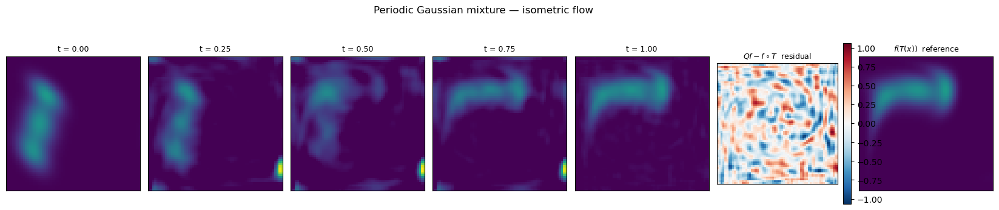

Gaussian mixture relative residual error  ||Qf - f∘T|| / ||f∘T|| = 0.0154


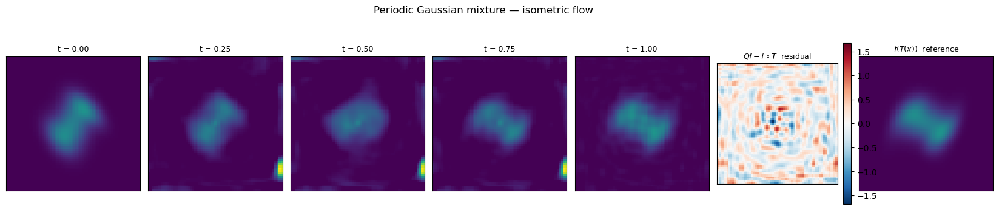

Gaussian mixture relative residual error  ||Qf - f∘T|| / ||f∘T|| = 0.0130


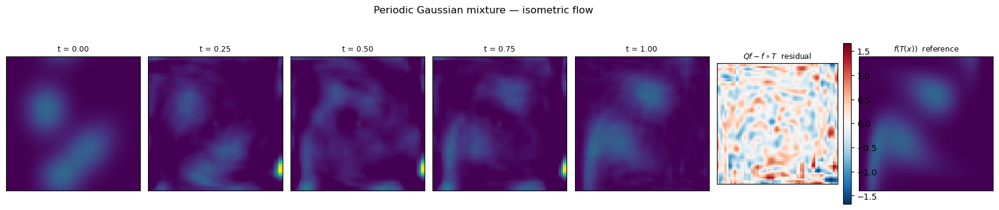

Gaussian mixture relative residual error  ||Qf - f∘T|| / ||f∘T|| = 0.0139


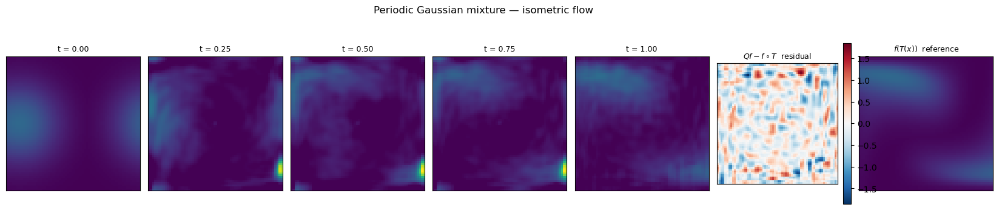

Gaussian mixture relative residual error  ||Qf - f∘T|| / ||f∘T|| = 0.0165


In [11]:
import math
from infidictionary.domain_samplers import SquareSampler

# ── Fresh grid coords for Gaussian experiment ─────────────────────────────────
N_GAUSS      = 64
gauss_coords = SquareSampler(stratified=True, add_noise=False).sample(N_GAUSS).to(device)
gauss_trans  = regularizer.transform(gauss_coords.cpu()).to(device)
gauss_lad    = torch.zeros(gauss_coords.shape[0], device=device)

# ── Define your mixture here ──────────────────────────────────────────────────
ALL_SPECS = [
    ([
        {'center': [0.25, 0.50], 'angle': 0.0,            'sigmas': (0.08, 0.12)},
        {'center': [0.2, 0.28], 'angle': math.pi / 5,    'sigmas': (0.06, 0.10)},
        {'center': [0.30, 0.72], 'angle': -math.pi / 4,   'sigmas': (0.10, 0.05)},
    ], [1.0, 0.8, 0.9]),
    ([
        {'center': [0.5, 0.5], 'angle': 0.0,            'sigmas': (0.08, 0.12)},
        {'center': [0.4, 0.4], 'angle': math.pi / 5,    'sigmas': (0.06, 0.10)},
        {'center': [0.6, 0.6], 'angle': -math.pi / 4,   'sigmas': (0.10, 0.05)},
    ], [1.0, 0.8, 0.9]),
    ([
        {'center': [0.3, 0.6], 'angle': 0.0,            'sigmas': (0.1, 0.12)},
        {'center': [0.4, 0.1], 'angle': math.pi / 5,    'sigmas': (0.1, 0.10)},
        {'center': [0.6, 0.3], 'angle': -math.pi / 4,   'sigmas': (0.10, 0.15)},
    ], [1.0, 0.8, 0.9]),
    ([
        {'center': [0.1, 0.5], 'angle': 0.0,            'sigmas': (0.2, 0.2)},
    ], [1.0]),
]

for GAUSSIAN_SPECS, GAUSSIAN_WEIGHTS in ALL_SPECS:
    K = 4   # number of incremental steps → K+1 frames shown (t=0, 1/K, …, 1)
    # ─────────────────────────────────────────────────────────────────────────────

    dt = 1.0 / K

    with torch.no_grad():
        g_orig = 10 * periodic_gaussian_mixture(gauss_coords, GAUSSIAN_SPECS, GAUSSIAN_WEIGHTS)
        g_ref  = 10 * periodic_gaussian_mixture(gauss_trans,  GAUSSIAN_SPECS, GAUSSIAN_WEIGHTS)

        # Fix model state once so all sub-steps share the same flow/clustering
        isometry.shuffle_model_state(**model_state_kwargs)

        # Chain: output of step k feeds into step k+1, over time interval [k·dt, (k+1)·dt]
        frames = [g_orig]
        for k in range(K):
            _, _, g_next = isometry.pushforward(
                src_coords=gauss_coords,
                src_logabsdet=gauss_lad,
                src_field=frames[-1].unsqueeze(0),
                start_time=k * dt,
                end_time=(k + 1) * dt,
            )
            frames.append(g_next[0])   # (N, 1)

        g_residual = frames[-1] - g_ref

    # ── Shared colour scale across all time frames ────────────────────────────────
    vmax_field = max(f[:, 0].max().item() for f in frames + [g_ref]) + 1e-8
    vmax_res   = g_residual[:, 0].abs().max().item() + 1e-8

    # ── Layout: K+1 evolution frames | residual | reference ──────────────────────
    ncols = K + 3
    fig, axes = plt.subplots(1, ncols, figsize=(3.0 * ncols, 4),
                            gridspec_kw={'wspace': 0.06})

    t_labels = [k * dt for k in range(K + 1)]
    for k, (t_val, frame) in enumerate(zip(t_labels, frames)):
        ax = axes[k]
        ax.imshow(field_to_img(frame, N_GAUSS), origin='lower',
                  cmap='viridis', vmin=0.0, vmax=vmax_field, extent=[0, 1, 0, 1])
        ax.set_title(f't = {t_val:.2f}', fontsize=9)
        ax.set_aspect('equal'); ax.set_xlim(0, 1); ax.set_ylim(0, 1)
        ax.set_xticks([]); ax.set_yticks([])

    # Analytical reference
    ax = axes[K + 2]
    ax.imshow(field_to_img(g_ref, N_GAUSS), origin='lower',
              cmap='viridis', vmin=0.0, vmax=vmax_field, extent=[0, 1, 0, 1])
    ax.set_title(r'$f(T(x))$  reference', fontsize=9)
    ax.set_aspect('equal'); ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.set_xticks([]); ax.set_yticks([])

    # Residual at t=1
    ax = axes[K + 1]
    im = ax.imshow(field_to_img(g_residual, N_GAUSS), origin='lower',
                   cmap='RdBu_r', vmin=-vmax_res, vmax=vmax_res, extent=[0, 1, 0, 1])
    plt.colorbar(im, ax=ax, fraction=0.06, pad=0.04)
    ax.set_title(r'$Qf - f\circ T$  residual', fontsize=9)
    ax.set_aspect('equal'); ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.set_xticks([]); ax.set_yticks([])

    fig.suptitle(
        rf"Periodic Gaussian mixture — isometric flow",
        fontsize=12,
    )
    plt.tight_layout()
    plt.show()

    from infidictionary.utils import norm2
    with torch.no_grad():
        rel_gauss = (
            norm2(g_residual.unsqueeze(0), gauss_lad)
            / norm2(g_ref.unsqueeze(0), gauss_lad).clamp(min=1e-12)
        ).item()
    print(f"Gaussian mixture relative residual error  ||Qf - f∘T|| / ||f∘T|| = {rel_gauss:.4f}")


### Volume-Preserving Sanity Check — L² Energy over Time

Pick a single Fourier atom $\phi_k$ and apply four chains for $K$ steps, each of size $\Delta t = $ `regularizer.total_time` (i.e. large coarse steps):

1. **Learned isometry** $Q^k\phi_k(x)$
2. **RK1 (forward Euler)** — $x \mapsto x + \Delta t\,V(x) \bmod 1$
3. **RK2 (Heun's method)** — $k_1 = V(x),\; k_2 = V(x+\Delta t k_1),\; x \mapsto x + \tfrac{\Delta t}{2}(k_1+k_2) \bmod 1$
4. **RK4 (classical)** — one 4-stage step of size $\Delta t$

The chart plots $\|\phi_k\|_{L^2}$ at each integer step $k$. A true volume-preserving map keeps energy exactly at 1 regardless of step size. RK1/RK2 diverge at large $\Delta t$; RK4 stays close; the learned $Q$ should remain flat.

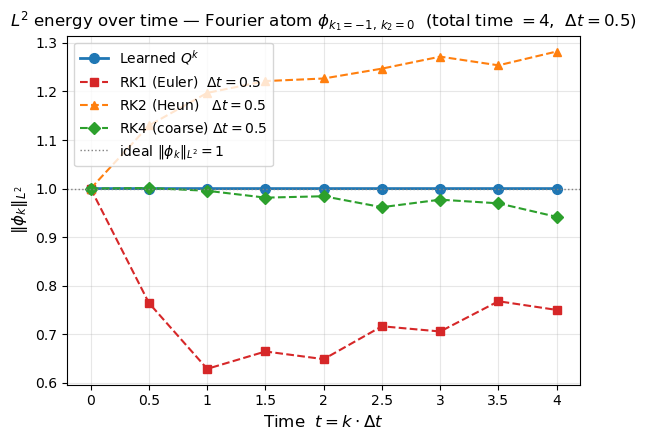

/tmp/ipykernel_1259703/4072685205.py:119: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


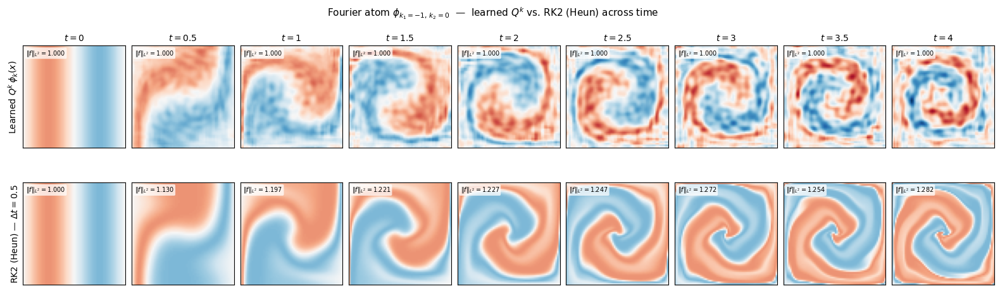

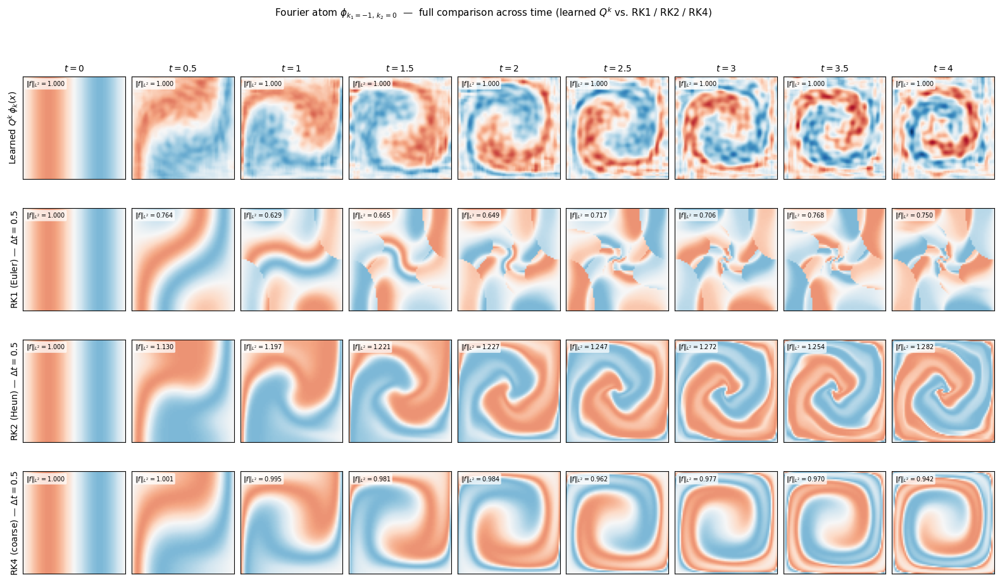

In [12]:
from infidictionary.domain_samplers import SquareSampler
from infidictionary.regularizers import TaylorGreenVortex
from infidictionary.utils import norm2

if not isinstance(regularizer, TaylorGreenVortex):
    print("Skipping: this cell is specific to TaylorGreenVortex (uses regularizer.total_time as Δt and regularizer.velocity).")
else:

    # ── Knobs ─────────────────────────────────────────────────────────────────────
    ATOM_IDX = torch.tensor([[-1, 0, 0]], device=device)
    K        = 8      # steps; total simulated time = K * T_dt = 4.0
    N_F      = 64

    T_dt = regularizer.total_time   # large step size for all integrators

    # ── Numerical integrators (one coarse step of size T_dt) ─────────────────────
    def rk1_step(coords: torch.Tensor) -> torch.Tensor:
        return (coords + T_dt * regularizer.velocity(coords)) % 1.0

    def rk2_step(coords: torch.Tensor) -> torch.Tensor:
        k1 = regularizer.velocity(coords)
        k2 = regularizer.velocity(coords + T_dt * k1)
        return (coords + (T_dt / 2.0) * (k1 + k2)) % 1.0

    def rk4_step(coords: torch.Tensor) -> torch.Tensor:
        k1 = regularizer.velocity(coords)
        k2 = regularizer.velocity(coords + 0.5 * T_dt * k1)
        k3 = regularizer.velocity(coords + 0.5 * T_dt * k2)
        k4 = regularizer.velocity(coords + T_dt * k3)
        return (coords + (T_dt / 6.0) * (k1 + 2.0 * k2 + 2.0 * k3 + k4)) % 1.0

    # ── Grid + initial atom ───────────────────────────────────────────────────────
    fcoords = SquareSampler(stratified=True, add_noise=False).sample(N_F).to(device)
    flad    = torch.zeros(fcoords.shape[0], device=device)

    def l2_norm(field: torch.Tensor) -> float:
        return norm2(field.unsqueeze(0), flad).item()

    def chain_integrator(step_fn):
        coords_chain = [fcoords]
        for _ in range(K):
            coords_chain.append(step_fn(coords_chain[-1].cpu()).to(device))
        return [dictionary.get_atoms(c, ATOM_IDX)[0] for c in coords_chain]

    with torch.no_grad():
        f_init = dictionary.get_atoms(fcoords, ATOM_IDX)[0]   # (N, 1)

        # Learned Q — chained pushforward
        isometry.shuffle_model_state(**model_state_kwargs)
        q_frames = [f_init]
        for k in range(K):
            _, _, f_next = isometry.pushforward(
                src_coords=fcoords, src_logabsdet=flad,
                src_field=q_frames[-1].unsqueeze(0),
                start_time=0, end_time=1.0,
            )
            q_frames.append(f_next[0])

        rk1_frames = chain_integrator(rk1_step)
        rk2_frames = chain_integrator(rk2_step)
        rk4_frames = chain_integrator(rk4_step)

    # ── L² energy at each step ────────────────────────────────────────────────────
    times = [k * T_dt for k in range(K + 1)]

    q_norms   = [l2_norm(f) for f in q_frames]
    rk1_norms = [l2_norm(f) for f in rk1_frames]
    rk2_norms = [l2_norm(f) for f in rk2_frames]
    rk4_norms = [l2_norm(f) for f in rk4_frames]

    # ── Figure 1: L² energy over time ─────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(6, 4.5))

    ax.plot(times, q_norms,   'o-',  lw=2.0, ms=7, label=r'Learned $Q^k$',                color='#1f77b4')
    ax.plot(times, rk1_norms, 's--', lw=1.5, ms=6, label=rf'RK1 (Euler)  $\Delta t={T_dt:g}$', color='#d62728')
    ax.plot(times, rk2_norms, '^--', lw=1.5, ms=6, label=rf'RK2 (Heun)   $\Delta t={T_dt:g}$', color='#ff7f0e')
    ax.plot(times, rk4_norms, 'D--', lw=1.5, ms=6, label=rf'RK4 (coarse) $\Delta t={T_dt:g}$', color='#2ca02c')
    ax.axhline(1.0, color='grey', lw=1.0, ls=':', label=r'ideal $\|\phi_k\|_{L^2} = 1$')

    ax.set_xlabel(r'Time  $t = k \cdot \Delta t$', fontsize=12)
    ax.set_ylabel(r'$\|\phi_k\|_{L^2}$', fontsize=12)
    ax.set_xticks(times)
    ax.set_xticklabels([f'{t:g}' for t in times])
    ax.legend(fontsize=10, loc='upper left')
    ax.grid(True, alpha=0.3)

    k1v, k2v, _ = ATOM_IDX[0].tolist()
    ax.set_title(
        rf"$L^2$ energy over time — Fourier atom $\phi_{{k_1={k1v},\,k_2={k2v}}}$"
        rf"  (total time $= {K * T_dt:g}$,  $\Delta t = {T_dt:g}$)",
        fontsize=12,
    )
    plt.tight_layout()
    plt.show()


    def plot_field_grid(row_specs, vmax, suptitle):
        fig, axes = plt.subplots(len(row_specs), K + 1,
                                  figsize=(2.2 * (K + 1), 2.6 * len(row_specs)),
                                  gridspec_kw={'wspace': 0.06, 'hspace': 0.18})
        for row_i, (frames, row_label) in enumerate(row_specs):
            for k, frame in enumerate(frames):
                ax = axes[row_i, k]
                ax.imshow(field_to_img(frame, N_F), origin='lower',
                          cmap='RdBu_r', vmin=-vmax, vmax=vmax, extent=[0, 1, 0, 1])
                if row_i == 0:
                    ax.set_title(rf"$t={k*T_dt:g}$", fontsize=10)
                if k == 0:
                    ax.set_ylabel(row_label, fontsize=10)
                ax.set_aspect('equal'); ax.set_xlim(0, 1); ax.set_ylim(0, 1)
                ax.set_xticks([]); ax.set_yticks([])
                ax.text(
                    0.03, 0.97, rf"$\|f\|_{{L^2}}={l2_norm(frame):.3f}$",
                    transform=ax.transAxes, ha='left', va='top', fontsize=7,
                    bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                              edgecolor='none', alpha=0.75),
                )
        fig.suptitle(suptitle, fontsize=11)
        plt.tight_layout()
        plt.show()


    # ── Figure 2: field deformation across time — learned Q vs. RK2 ──────────────
    vmax_qr2 = max(f.abs().max().item() for f in q_frames + rk2_frames) + 1e-8
    plot_field_grid(
        [(q_frames,   r"Learned $Q^k\,\phi_k(x)$"),
         (rk2_frames, rf"RK2 (Heun) — $\Delta t={T_dt:g}$")],
        vmax_qr2,
        rf"Fourier atom $\phi_{{k_1={k1v},\,k_2={k2v}}}$  —  learned $Q^k$ vs. RK2 (Heun) across time",
    )

    # ── Figure 3: full four-method comparison across time ────────────────────────
    vmax_all = max(f.abs().max().item()
                   for f in q_frames + rk1_frames + rk2_frames + rk4_frames) + 1e-8
    plot_field_grid(
        [(q_frames,   r"Learned $Q^k\,\phi_k(x)$"),
         (rk1_frames, rf"RK1 (Euler) — $\Delta t={T_dt:g}$"),
         (rk2_frames, rf"RK2 (Heun) — $\Delta t={T_dt:g}$"),
         (rk4_frames, rf"RK4 (coarse) — $\Delta t={T_dt:g}$")],
        vmax_all,
        rf"Fourier atom $\phi_{{k_1={k1v},\,k_2={k2v}}}$  —  full comparison across time "
        rf"(learned $Q^k$ vs. RK1 / RK2 / RK4)",
    )